In [1]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [2]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2019-01-01 00:00:00 to 2019-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None


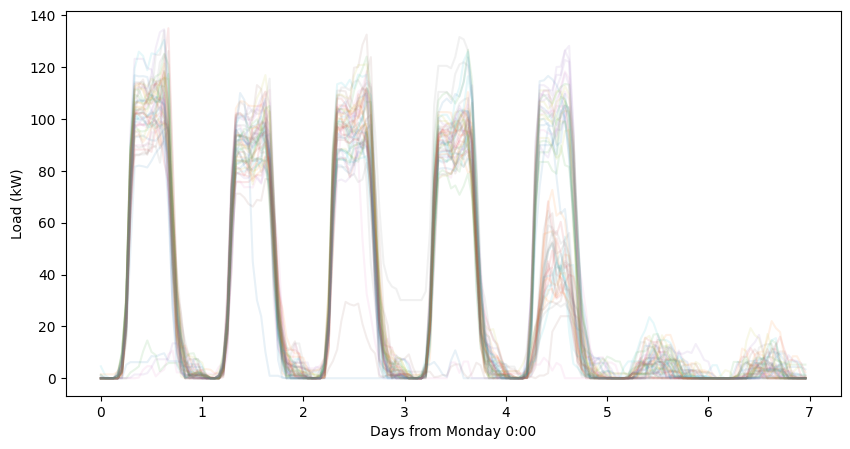

In [3]:
load = pd.read_csv(dir+'caltech-ev_load.csv',
                   index_col=0,
                   parse_dates=True,
                   #usecols=['Time','Potenza'],
                   )\
                    .resample('1h').mean()\
                    .fillna(method='ffill')\
                    .loc['2019']
load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
load.loc['2019-5-20'] = load.loc['2019-5-22'].values
load.loc['2019-5-21'] = load.loc['2019-5-22'].values

print(load.info())
plot_weekly(load['Load (kW)'])

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [4]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,29.123752,26.034762,27.853227,28.512137
std,41.119398,36.745401,36.615397,36.311841
min,-0.101323,-0.101323,-0.092342,-0.084746
25%,-0.011986,-0.011986,-0.011986,-0.011986
50%,-0.011986,-0.011986,-0.011986,-0.011986
75%,57.585777,51.039946,53.645400,61.456097
max,166.166728,160.088303,140.292762,129.102278


In [5]:
solar.plot()

In [6]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [7]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
2019-01-01 00:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
2019-01-01 01:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
2019-01-01 02:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
2019-01-01 03:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
2019-01-01 04:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,1.845491,-0.011986,-0.011986,-0.011986,-0.011986,1.857477,1.857477,1.857477,1.857477
2019-12-31 20:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
2019-12-31 21:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986
2019-12-31 22:00:00,0.000000,-0.011986,-0.011986,-0.011986,-0.011986,0.011986,0.011986,0.011986,0.011986


load v s20

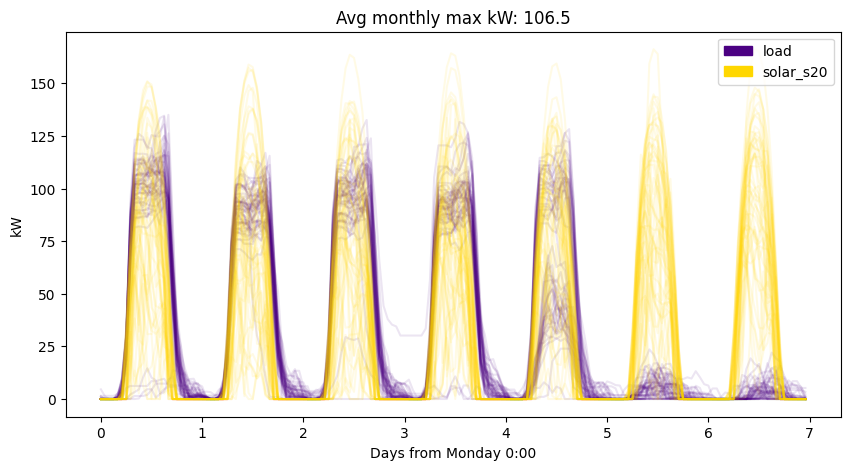

In [8]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

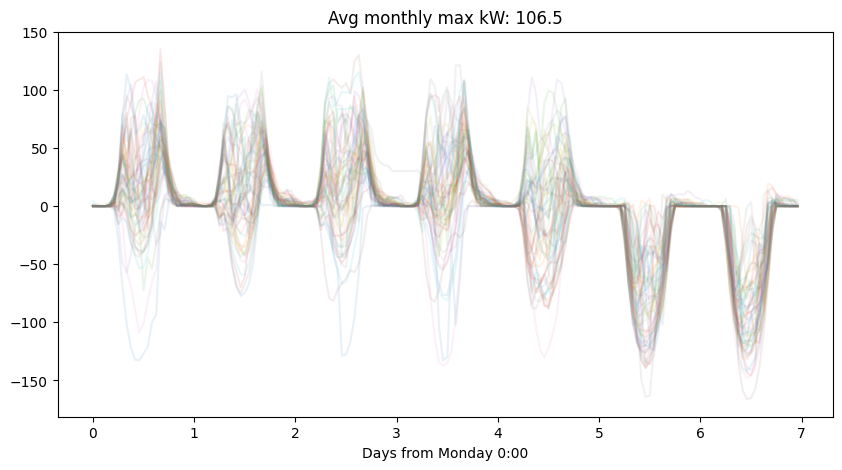

In [9]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

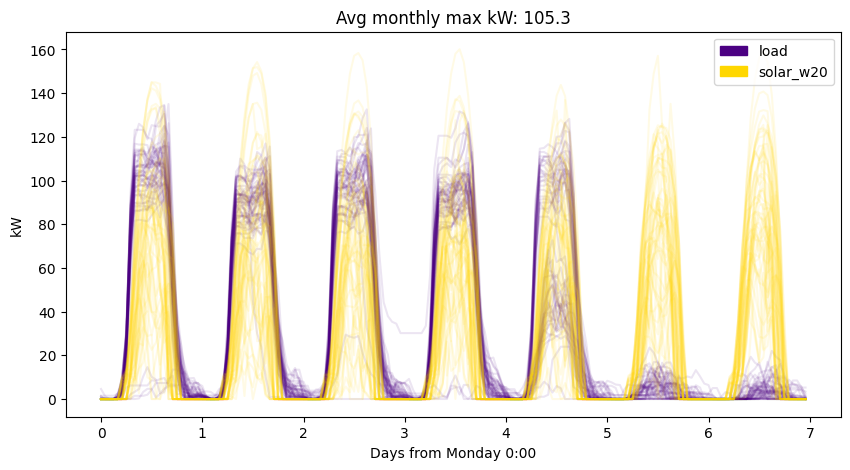

In [10]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

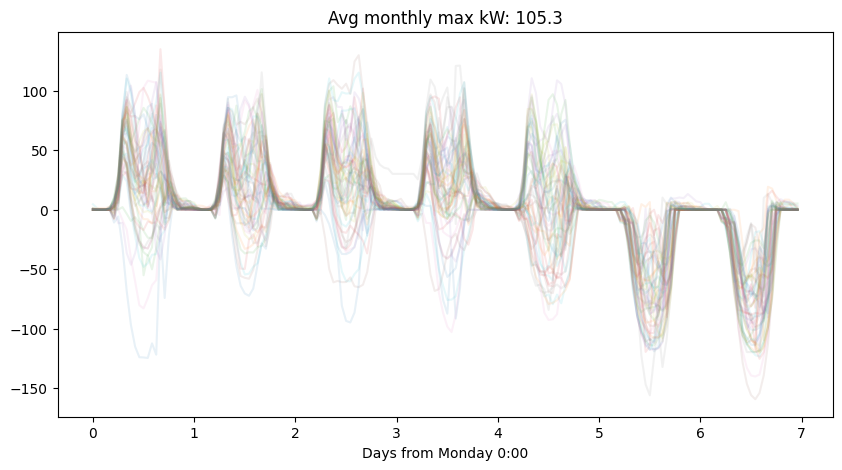

In [11]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

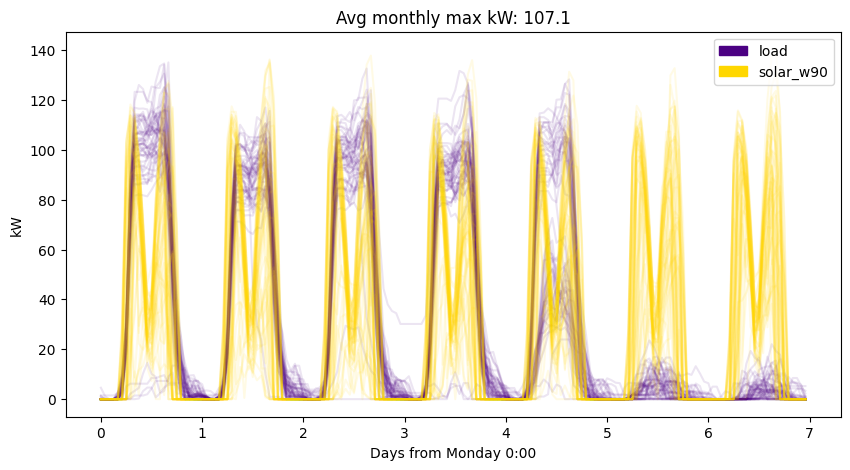

In [12]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

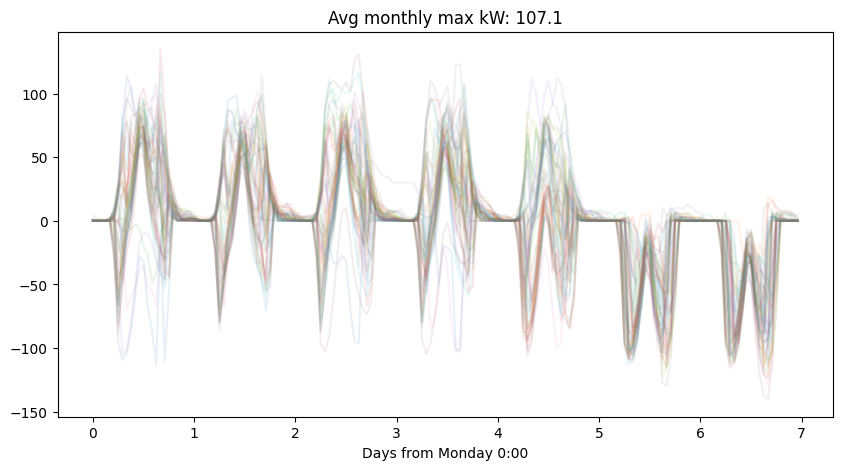

In [13]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

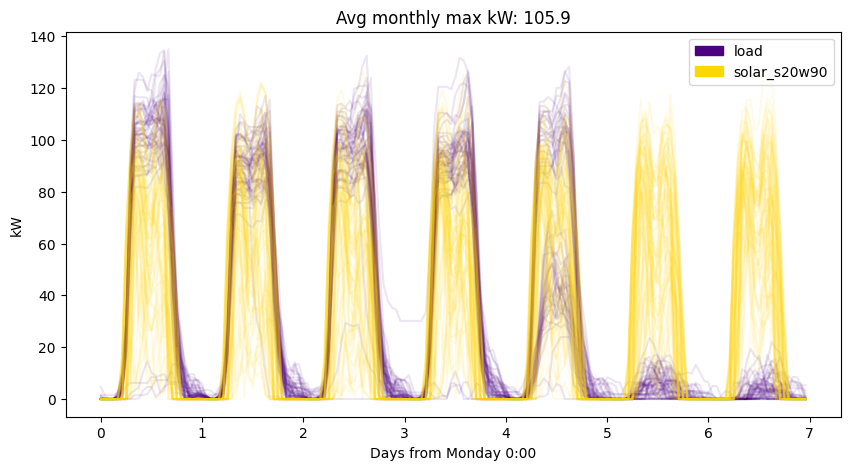

In [14]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

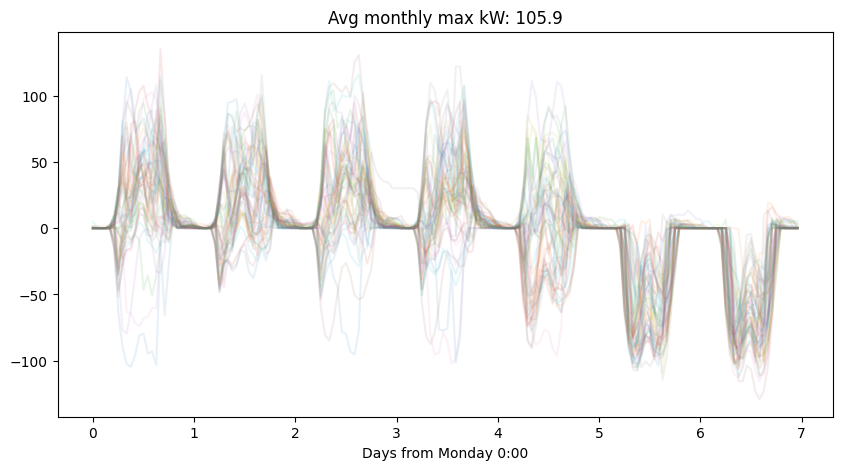

In [15]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [16]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 2.4416666666666664
Avg w90 reduction 4.95
Avg s20w90 reduction 4.3


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,95.4,2019-01-31 09:00:00,95.4,2019-01-31 09:00:00,0.0,95.9,2019-01-31 09:00:00,-0.5,95.6,2019-01-31 09:00:00,-0.2
2,110.6,2019-02-08 08:00:00,110.6,2019-02-08 08:00:00,0.0,111.5,2019-02-08 08:00:00,-0.9,111.0,2019-02-08 08:00:00,-0.4
3,77.2,2019-03-08 08:00:00,89.9,2019-03-04 08:00:00,-12.7,78.5,2019-03-08 08:00:00,-1.3,77.9,2019-03-08 08:00:00,-0.7
4,71.4,2019-04-17 08:00:00,71.4,2019-04-17 08:00:00,0.0,72.6,2019-04-17 08:00:00,-1.2,72.0,2019-04-17 08:00:00,-0.6
5,74.9,2019-05-17 08:00:00,75.0,2019-05-17 08:00:00,-0.1,78.0,2019-05-17 08:00:00,-3.1,76.4,2019-05-17 08:00:00,-1.5
6,56.5,2019-06-28 10:00:00,64.0,2019-06-24 08:00:00,-7.5,70.3,2019-06-28 10:00:00,-13.8,63.4,2019-06-28 10:00:00,-6.9
7,83.8,2019-07-31 10:00:00,65.0,2019-07-31 10:00:00,18.8,60.7,2019-07-10 10:00:00,23.1,62.2,2019-07-31 10:00:00,21.6
8,106.7,2019-08-26 10:00:00,89.6,2019-08-26 10:00:00,17.1,79.0,2019-08-21 09:00:00,27.7,88.7,2019-08-26 10:00:00,18.0
9,91.1,2019-09-03 10:00:00,77.4,2019-09-30 08:00:00,13.7,59.7,2019-09-30 10:00:00,31.4,67.8,2019-09-03 10:00:00,23.3
10,103.8,2019-10-30 09:00:00,103.8,2019-10-30 09:00:00,0.0,103.8,2019-10-30 09:00:00,0.0,103.8,2019-10-30 09:00:00,0.0


Oddity: s20<w20 in AM
- why does s20 sometimes have a higher morning peak than w20?
- during some morning times w20 is greater than s20.. why??

In [17]:
df[['load','solar_s20','solar_w20']].loc['2019-7-30':'2019-8-1'].plot(title='July peak: 2019-7-31 10:00')

## Variable TOU

w20

In [18]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>4]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
12,9,11,24.2,4.6,-4.3
68,16,18,21.7,6.1,-2.9
69,16,19,21.7,6.1,-2.9
70,16,20,21.7,6.1,-2.9
71,16,21,21.7,6.1,-2.9
72,17,19,31.3,7.3,0.0
73,17,20,31.3,7.3,0.0
74,17,21,31.3,7.3,0.0


w90

In [19]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>4]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,31.4,5.0,-13.8
68,16,18,31.5,6.8,-8.6
69,16,19,31.5,6.8,-8.6
70,16,20,31.5,6.8,-8.6
71,16,21,31.5,6.8,-8.6
72,17,19,30.4,8.3,0.0
73,17,20,30.4,8.3,0.0
74,17,21,30.4,8.3,0.0
75,18,20,17.8,4.5,0.0
76,18,21,17.8,4.5,0.0


s20w90

In [20]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>4]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,23.3,4.3,-6.9
72,17,19,28.0,7.2,0.0
73,17,20,28.0,7.2,0.0
74,17,21,28.0,7.2,0.0


Best for w90

In [21]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [22]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [23]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [25]:
threshold = 100
batt_kwh_max = 50
angle = 's20'
TOU_hours = list(range(24))

batt_kwh,dfps = find_smallest_soe0(df,
                                   f'netload_{angle}',
                                   threshold,
                                   batt_kwh_max,
                                   TOU_hours)

plotly_stacked(dfps,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Failure to find solution: netload_s20, Threshold kw = 100.0, Battery kWh max = 50.0,


### Several angles

In [24]:
results = {'solar':[],'batt_kwh':[],'dfps':[]}
threshold = 100
batt_kwh_max = 100
TOU_hours = list(range(24))

for angle in ['s20','w20','w90','s20w90']:
    batt_kwh,dfps = find_smallest_soe0(df,
                              f'netload_{angle}',
                              threshold,
                              batt_kwh_max,
                              TOU_hours,)
    results['solar'].append(angle)
    results['batt_kwh'].append(batt_kwh)
    results['dfps'].append(dfps)
    
print('\n',pd.DataFrame(results).iloc[:,:2])

Solution found: netload_s20, Threshold kw = 100.0, Battery kWh = 89.0,
Solution found: netload_w20, Threshold kw = 100.0, Battery kWh = 90.0,
Failed on first battery size, try 1.1x
Solution found: netload_w90, Threshold kw = 100.0, Battery kWh = 106.0,
Solution found: netload_s20w90, Threshold kw = 100.0, Battery kWh = 97.0,

     solar  batt_kwh
0     s20        89
1     w20        90
2     w90       106
3  s20w90        97


s20

In [25]:
dfps = results['dfps'][0]
solar = results['solar'][0]
batt_kwh = results['batt_kwh'][0]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [26]:
dfps = results['dfps'][2]
solar = results['solar'][2]
batt_kwh = results['batt_kwh'][2]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [26]:
threshold = 10
batt_kwh_max = 200
angle = 's20'
TOU_hours = list(range(16,21))

batt_kwh,dfps = find_smallest_soe0(df,
                                   f'netload_{angle}',
                                   threshold,
                                   batt_kwh_max,
                                   TOU_hours,)

plotly_stacked(dfps,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Failed on first battery size, try 5x
Solution found: netload_s20, Threshold kw = 10.0, Battery kWh = 616.0,


### Several angles

In [30]:
threshold = 10
batt_kwh_max = 700
TOU_hours = list(range(16,21))

results = {'solar':[],'batt_kwh':[],'dfps':[]}
for solar_angle in ['s20','w20','w90','s20w90']:
    df2 = df.copy(deep=True)
    batt_kwh,dfps = find_smallest_soe0(df,
                              f'netload_{solar_angle}',
                              threshold,
                              batt_kwh_max,
                              TOU_hours,)
    results['solar'].append(solar_angle)
    results['batt_kwh'].append(batt_kwh)
    results['dfps'].append(dfps)
    
print('\n',pd.DataFrame(results).iloc[:,:2])

Solution found: netload_s20, Threshold kw = 10.0, Battery kWh = 616.0,
Solution found: netload_w20, Threshold kw = 10.0, Battery kWh = 618.0,
Solution found: netload_w90, Threshold kw = 10.0, Battery kWh = 598.0,
Solution found: netload_s20w90, Threshold kw = 10.0, Battery kWh = 612.0,

     solar  batt_kwh
0     s20       616
1     w20       618
2     w90       598
3  s20w90       612


s20

In [44]:
dfps = results['dfps'][0]
solar = results['solar'][0]
batt_kwh = results['batt_kwh'][0]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [45]:
dfps = results['dfps'][2]
solar = results['solar'][2]
batt_kwh = results['batt_kwh'][2]
plotly_stacked(dfps,
               solar='solar_'+solar,
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {solar} <br>Battery kWh = {batt_kwh:.1f}')

### Several TOUs and angles

In [31]:
threshold = 10
batt_kwh_max = 700
TOU_hours = list(range(17,21))

mega_results = {}
for h_begin in list(range(9,18)):
    mega_results[f'h_begin{h_begin}'] = []
    for h_end in list(range(11,21)):
        if (h_end - h_begin) >= 2:
            results = {'solar':[],'batt_kwh':[],'dfps':[]}
            for solar_angle in ['s20','w20','w90','s20w90']:
                df2 = df.copy(deep=True)
                batt_kwh,dfps = find_smallest_soe0(df,
                                        f'netload_{solar_angle}',
                                        threshold,
                                        batt_kwh_max,
                                        TOU_hours,)
                results['solar'].append(solar_angle)
                results['batt_kwh'].append(batt_kwh)
                results['dfps'].append(dfps)
                i = pd.DataFrame(results).batt_kwh.argmin()
                best_batt_kwh = results['batt_kwh'][i]
                best_solar = results['solar'][i]
                
            mega_results[f'h_begin{h_begin}'].append(f'{best_solar} {best_batt_kwh}')
        else:
            mega_results[f'h_begin{h_begin}'].append(f'')
            

Solution found: netload_s20, Threshold kw = 10.0, Battery kWh = 278.0,
Solution found: netload_w20, Threshold kw = 10.0, Battery kWh = 236.0,
Solution found: netload_w90, Threshold kw = 10.0, Battery kWh = 236.0,
Solution found: netload_s20w90, Threshold kw = 10.0, Battery kWh = 236.0,

     solar  batt_kwh
0     s20       278
1     w20       236
2     w90       236
3  s20w90       236


In [39]:
i = pd.DataFrame(results).batt_kwh.argmin()
results['batt_kwh'][i]
results['solar'][i]

'w20'